# Breast Invasive Carcinoma (TCGA, PanCancer Atlas)

The dataset contains 1084 patients from which 1084 samples were extracted. The data come from TCGA, PanCancer Atlas. The Cancer Genome Atlas (TCGA) Research Network has profiled and analyzed large numbers of human tumors to discover molecular aberrations at the DNA, RNA, protein and epigenetic levels. The resulting rich data provide a major opportunity to develop an integrated picture of commonalities, differences and emergent themes across tumor lineages. The Pan-Cancer Atlas initiative compares the 33 tumor types profiled by TCGA. Analysis of the molecular aberrations and their functional roles across tumor types will teach us how to extend therapies effective in one cancer type to others with a similar genomic profile.

In [1]:
import os

In [2]:
os.chdir("C:/Users/Cristina/OneDrive/Documenti/BCG/Tesi/Datasets/Breast Invasive Carcinoma (TCGA, PanCancer Atlas)")

In [111]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ydata_profiling as yp
from ydata_profiling import ProfileReport

## Patients clinical data 

In [4]:
data_clinical_patient=pd.read_csv('data_clinical_patient.csv', sep=None, engine='python')
data_clinical_patient

,PATIENT_ID,SUBTYPE,CANCER_TYPE_ACRONYM,OTHER_PATIENT_ID,AGE,SEX,AJCC_PATHOLOGIC_TUMOR_STAGE,AJCC_STAGING_EDITION,DAYS_LAST_FOLLOWUP,DAYS_TO_BIRTH,...,WEIGHT,IN_PANCANPATHWAYS_FREEZE,OS_STATUS,OS_MONTHS,DSS_STATUS,DSS_MONTHS,DFS_STATUS,DFS_MONTHS,PFS_STATUS,PFS_MONTHS
0,TCGA-3C-AAAU,BRCA_LumA,BRCA,6E7D5EC6-A469-467C-B748-237353C23416,55,Female,STAGE X,6TH,4047.0,-20211.0,...,NaN,Yes,0:LIVING,1.330.505.967,0:ALIVE OR DEAD TUMOR FREE,1.330.505.967,1:Recurred/Progressed,5.944.044.449,1:PROGRESSION,5.944.044.449
1,TCGA-3C-AALI,BRCA_Her2,BRCA,55262FCB-1B01-4480-B322-36570430C917,50,Female,STAGE IIB,6TH,4005.0,-18538.0,...,NaN,Yes,0:LIVING,1.316.697.899,0:ALIVE OR DEAD TUMOR FREE,1.316.697.899,0:DiseaseFree,1.316.697.899,0:CENSORED,1.316.697.899
2,TCGA-3C-AALJ,BRCA_LumB,BRCA,427D0648-3F77-4FFC-B52C-89855426D647,62,Female,STAGE IIB,7TH,1474.0,-22848.0,...,NaN,Yes,0:LIVING,4.845.974.291,0:ALIVE OR DEAD TUMOR FREE,4.845.974.291,0:DiseaseFree,4.845.974.291,0:CENSORED,4.845.974.291
3,TCGA-3C-AALK,BRCA_LumA,BRCA,C31900A4-5DCD-4022-97AC-638E86E889E4,52,Female,STAGE IA,7TH,1448.0,-19074.0,...,NaN,Yes,0:LIVING,4.760.495.775,0:ALIVE OR DEAD TUMOR FREE,4.760.495.775,NaN,NaN,0:CENSORED,4.760.495.775
4,TCGA-4H-AAAK,BRCA_LumA,BRCA,6623FC5E-00BE-4476-967A-CBD55F676EA6,50,Female,STAGE IIIA,7TH,348.0,-18371.0,...,NaN,Yes,0:LIVING,1.144.097.051,0:ALIVE OR DEAD TUMOR FREE,1.144.097.051,0:DiseaseFree,1.144.097.051,0:CENSORED,1.144.097.051
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1079,TCGA-WT-AB44,BRCA_LumA,BRCA,5CD79093-1571-4F71-8136-0D84CCABDCAC,77,Female,STAGE IA,7TH,883.0,NaN,...,NaN,Yes,0:LIVING,2.902.981.885,0:ALIVE OR DEAD TUMOR FREE,2.902.981.885,0:DiseaseFree,2.902.981.885,0:CENSORED,2.902.981.885
1080,TCGA-XX-A899,BRCA_LumA,BRCA,F89588E9-CA73-4465-A7FB-7246EDB45E3A,46,Female,STAGE IIIA,7TH,467.0,-17022.0,...,NaN,Yes,0:LIVING,153.532.564,0:ALIVE OR DEAD TUMOR FREE,153.532.564,0:DiseaseFree,153.532.564,0:CENSORED,153.532.564
1081,TCGA-XX-A89A,BRCA_LumA,BRCA,CA20249F-B7EA-4FD9-9ECB-34F74755AE35,68,Female,STAGE IIB,7TH,488.0,-25000.0,...,NaN,Yes,0:LIVING,160.436.598,0:ALIVE OR DEAD TUMOR FREE,160.436.598,0:DiseaseFree,160.436.598,0:CENSORED,160.436.598
1082,TCGA-Z7-A8R5,BRCA_LumA,BRCA,23F438BD-1DBB-4D46-972F-1E8E74DDBD37,61,Female,STAGE IIIA,6TH,3287.0,-22280.0,...,NaN,Yes,0:LIVING,1.080.645.692,0:ALIVE OR DEAD TUMOR FREE,1.080.645.692,NaN,NaN,1:PROGRESSION,5.950.619.719


#### Select basal BC patients 

In [5]:
basal_pts = data_clinical_patient.loc[data_clinical_patient['SUBTYPE']=='BRCA_Basal']

In [6]:
basal_pts = basal_pts[['PATIENT_ID']].copy()

In [7]:
basal_pts.loc[:, 'Target'] = 1 
basal_pts

,PATIENT_ID,Target
15,TCGA-A1-A0SK,1
18,TCGA-A1-A0SO,1
19,TCGA-A1-A0SP,1
22,TCGA-A2-A04P,1
23,TCGA-A2-A04Q,1
...,...,...
1060,TCGA-PL-A8LV,1
1063,TCGA-PL-A8LZ,1
1067,TCGA-S3-AA0Z,1
1068,TCGA-S3-AA10,1


In [8]:
basal_pts_list = basal_pts['PATIENT_ID'].to_list()
len(basal_pts_list)

171

#### Select non basal BC patients 

In [9]:
NON_basal_patients = data_clinical_patient[~data_clinical_patient['PATIENT_ID'].isin(basal_pts_list)]

In [10]:
NON_basal_patients = NON_basal_patients[['PATIENT_ID']].copy()

In [11]:
NON_basal_patients.loc[:, 'Target'] = 0 
NON_basal_patients

,PATIENT_ID,Target
0,TCGA-3C-AAAU,0
1,TCGA-3C-AALI,0
2,TCGA-3C-AALJ,0
3,TCGA-3C-AALK,0
4,TCGA-4H-AAAK,0
...,...,...
1079,TCGA-WT-AB44,0
1080,TCGA-XX-A899,0
1081,TCGA-XX-A89A,0
1082,TCGA-Z7-A8R5,0


In [12]:
NON_basal_patients_list = NON_basal_patients['PATIENT_ID'].to_list()

In [13]:
# concatenate all the TCGA patient
total_pts = pd.concat([basal_pts, NON_basal_patients])

In [14]:
total_pts['Target'].value_counts()

Target
0    913
1    171
Name: count, dtype: int64

In [15]:
os.chdir("C:/Users/Cristina/OneDrive/Documenti/BCG/Tesi/TCGA_survival_data_intrinsic_subtypes")
# save the training patients 
total_pts.to_csv('TCGA_patients_withLabels.txt', index=False, sep='\t')

In [16]:
profile_patient = ProfileReport(data_clinical_patient, title="Pandas Profiling Report")

In [17]:
profile_patient

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The observations (patients) are 1084. The tumor subtypes are indicated (9.5% missing values). The younger patient is 26, whereas the olden pts is 90. The average age is 58.4. There are only 12 males in the cohort. 
The tumor staging according to the American Joint Committee on Cancer Tumor Stage Code is present (0.5% of missing values): it represents the extent of a cancer, especially whether the disease has spread from the original site to other parts of the body based on AJCC staging criteria.
There is also the AJCC Publication Version Type, that is the version or edition of the American Joint Committee on Cancer Cancer Staging Handbooks, a publication by the group formed for the purpose of developing a system of clinical staging for cancer that is acceptable to the American medical profession and is compatible with other accepted classifications.
DAYS_LAST_FOLLOWUP variable (9.6% missing) shows the time interval from the date of last followup to the date of initial pathologic diagnosis, represented as a calculated number of days. 
DAYS_TO_BIRTH variable (1.4% missing) shows the time interval from a person's date of birth to the date of initial pathologic diagnosis, represented as a calculated number of days.
HISTORY_NEOADJUVANT_TRTYN is a Boolean variable indicating whether the neoadjuvant treatment is administered to the patient prior to resection of the tumor (0.1% missing).
NEW_TUMOR_EVENT_AFTER_INITIAL_TREATMENT is an indicator to identify whether a patient has had a new tumor event after initial treatment (18.4% missing).
The TNM staging scores are present too.
PRIOR_DX stays for "prior diagnosis".
The race and the ethnicity are present too.
For each pts, it is indicated if she/he underwent a radiation therapy.
OS_STATUS is the overall survival status (86.1% living, 13.9% deceased).
DSS_STATUS is the disease-specific survival status: the time period usually begins at the time of diagnosis or at the start of treatment and ends at the time of death. (90.5%: alive or dead tumor free, 7.7% dead with tumor, 1.8% missing).
DFS_STATUS is the disease free status: 79.2% are disease-free, 7.7% recurred/progressed, 13.1% missing.
PFS_STATUS is the progression free status: 86.5% are censored.
For each status the time in months is present (the time period (months) usually begins at the time of diagnosis or at the start of treatment and ends at the time of death). 

## Samples clinical data 

In [18]:
os.chdir("C:/Users/Cristina/OneDrive/Documenti/BCG/Tesi/Datasets/Breast Invasive Carcinoma (TCGA, PanCancer Atlas)")
data_clinical_sample=pd.read_csv('data_clinical_sample.csv', sep=None, engine='python')
data_clinical_sample

,PATIENT_ID,SAMPLE_ID,ONCOTREE_CODE,CANCER_TYPE,CANCER_TYPE_DETAILED,TUMOR_TYPE,GRADE,TISSUE_PROSPECTIVE_COLLECTION_INDICATOR,TISSUE_RETROSPECTIVE_COLLECTION_INDICATOR,TISSUE_SOURCE_SITE_CODE,TUMOR_TISSUE_SITE,ANEUPLOIDY_SCORE,SAMPLE_TYPE,MSI_SCORE_MANTIS,MSI_SENSOR_SCORE,SOMATIC_STATUS,TMB_NONSYNONYMOUS,TISSUE_SOURCE_SITE
0,TCGA-3C-AAAU,TCGA-3C-AAAU-01,ILC,Breast Cancer,Breast Invasive Lobular Carcinoma,Infiltrating Lobular Carcinoma,NaN,No,Yes,3C,Breast,19.0,Primary,0.3319,0.55,Matched,0.8,Columbia University
1,TCGA-3C-AALI,TCGA-3C-AALI-01,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,Infiltrating Ductal Carcinoma,NaN,No,Yes,3C,Breast,22.0,Primary,0.3449,0.74,Matched,1.526.666.667,Columbia University
2,TCGA-3C-AALJ,TCGA-3C-AALJ-01,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,Infiltrating Ductal Carcinoma,NaN,No,Yes,3C,Breast,13.0,Primary,0.3266,0.31,Matched,0.933333333,Columbia University
3,TCGA-3C-AALK,TCGA-3C-AALK-01,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,Infiltrating Ductal Carcinoma,NaN,No,Yes,3C,Breast,4.0,Primary,0.3218,0.03,Matched,1.5,Columbia University
4,TCGA-4H-AAAK,TCGA-4H-AAAK-01,ILC,Breast Cancer,Breast Invasive Lobular Carcinoma,Infiltrating Lobular Carcinoma,NaN,Yes,No,4H,Breast,7.0,Primary,0.3411,0.01,Matched,0.7,"Proteogenex, Inc."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1079,TCGA-WT-AB44,TCGA-WT-AB44-01,ILC,Breast Cancer,Breast Invasive Lobular Carcinoma,Infiltrating Lobular Carcinoma,NaN,No,Yes,WT,Breast,18.0,Primary,0.3186,0.24,Matched,1.033.333.333,University of Kansas
1080,TCGA-XX-A899,TCGA-XX-A899-01,ILC,Breast Cancer,Breast Invasive Lobular Carcinoma,Infiltrating Lobular Carcinoma,NaN,No,Yes,XX,Breast,4.0,Primary,0.3100,0.00,Matched,2.466.666.667,Spectrum Health
1081,TCGA-XX-A89A,TCGA-XX-A89A-01,ILC,Breast Cancer,Breast Invasive Lobular Carcinoma,Infiltrating Lobular Carcinoma,NaN,No,Yes,XX,Breast,32.0,Primary,0.3036,0.01,Matched,5.033.333.333,Spectrum Health
1082,TCGA-Z7-A8R5,TCGA-Z7-A8R5-01,ILC,Breast Cancer,Breast Invasive Lobular Carcinoma,Infiltrating Lobular Carcinoma,NaN,No,Yes,Z7,Breast,21.0,Primary,0.3056,0.00,Matched,0.766666667,John Wayne Cancer Center


In [19]:
profile_sample = ProfileReport(data_clinical_sample, title="Pandas Profiling Report")

In [20]:
profile_sample

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

ONCOTREE_CODE and CANCER_TYPE_DETAILED and TUMOR_TYPE variables give the same information: the 72% of the samples are Breast Invasive Ductal Carcinoma samples. 
The 66.3% of the samples have been collected in a retrospective way; the 33.3% in a prospective way. A retrospective collection is a collection of biospecimens that have previously been stored/archived (ie. the samples already exist). Retrospective samples are generally stored long term either frozen (eg. serum, plasma, tissue, cells, DNA) or at room temperature (eg. FFPE blocks, slides). A prospective collection is the collection of biospecimens from subjects in the future (ie. the samples do not already exist). 
The aneuplidy score is present: it is defined as the total number of altered chromosome arms and ranged from 0 (no altered chromosome arms) to 39 (alterations in all examined chromosome arms).
All the samples are from primary tumor.
MSI score is indicated: it represent the microsatellite instability. Microsatellites are regions of repeated DNA that change in length (show instability) when mismatch repair is not working properly. MSI testing looks at the length of certain DNA microsatellites from the tumor sample to see if they have gotten longer or shorter as a measure of instability. 
There are 2 types of MSI scores, based on the detection tool that was used :
 1. MANTIS 
 2. Sensor 
 
The samples were collected from different source sites.

In [21]:
# keep only the relevant variables 
data_clinical_sample_relevant=data_clinical_sample.drop(['ONCOTREE_CODE', 'TUMOR_TYPE', 'SOMATIC_STATUS', 'GRADE', 'CANCER_TYPE', 'TUMOR_TISSUE_SITE', 'TISSUE_SOURCE_SITE_CODE'],axis=1)

#### Select ductal BC patients 

In [22]:
ductal_pts = data_clinical_sample.loc[data_clinical_sample['ONCOTREE_CODE']=='IDC']

In [23]:
ductal_pts = ductal_pts[['PATIENT_ID']]

#### Select basal and ductal BC patients 

In [24]:
# select patients both basal and DC
basal_ductal_pts = pd.merge(ductal_pts, basal_pts, how='inner', on=['PATIENT_ID'])

In [25]:
# select the IDC patients not basal
x = pd.concat([basal_ductal_pts, ductal_pts])
ductal_NON_basal_pts = x.drop_duplicates(keep=False, inplace=False)

### Timeline sample acquisition

In [26]:
timeline_sample_acquisition = pd.read_csv('data_timeline_sample_acquisition.csv', sep=None, engine='python')
timeline_sample_acquisition

,PATIENT_ID,START_DATE,STOP_DATE,EVENT_TYPE,SAMPLE_ID,METHOD_OF_SAMPLE_PROCUREMENT,COUNTRY,SAMPLE_PRESCREENED,TOP_SLIDE_SUBMITTED,TUMOR_NECROSIS_PERCENT,TUMOR_NUCLEI_PERCENT,TUMOR_WEIGHT,VESSEL_USED
0,TCGA-3C-AAAU,0,NaN,Sample Acquisition,TCGA-3C-AAAU-01,Modified Radical Mastectomy,United States,Yes,NaN,1.0,80,150.0,Cryomold
1,TCGA-3C-AALI,13,NaN,Sample Acquisition,TCGA-3C-AALI-01,Lumpectomy,United States,Yes,NaN,5.0,60,150.0,Cryomold
2,TCGA-3C-AALJ,32,NaN,Sample Acquisition,TCGA-3C-AALJ-01,Modified Radical Mastectomy,United States,Yes,NaN,2.0,80,150.0,Cryomold
3,TCGA-3C-AALK,99,NaN,Sample Acquisition,TCGA-3C-AALK-01,Simple Mastectomy,United States,Yes,NaN,2.0,80,150.0,Cryomold
4,TCGA-4H-AAAK,5,NaN,Sample Acquisition,TCGA-4H-AAAK-01,Modified Radical Mastectomy,Russia,Yes,NaN,0.0,85,800.0,Cryovial
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1076,TCGA-WT-AB44,31,NaN,Sample Acquisition,TCGA-WT-AB44-01,Lumpectomy,United States,Yes,NaN,5.0,70,289.0,Cryovial
1077,TCGA-XX-A89A,34,NaN,Sample Acquisition,TCGA-XX-A89A-01,Simple Mastectomy,United States,Yes,NaN,0.0,70,252.0,Cryovial
1078,TCGA-XX-A899,52,NaN,Sample Acquisition,TCGA-XX-A899-01,Modified Radical Mastectomy,United States,Yes,NaN,0.0,80,262.0,Cryovial
1079,TCGA-Z7-A8R5,30,NaN,Sample Acquisition,TCGA-Z7-A8R5-01,Lumpectomy,United States,Yes,NaN,0.0,80,150.0,Cryomold


In [27]:
timeline_sample_acquisition['PATIENT_ID'].nunique()

1080

### Timeline treatment

In [28]:
timeline_treatment = pd.read_csv('data_timeline_treatment.txt', sep=None, engine='python')
timeline_treatment 

,PATIENT_ID,START_DATE,STOP_DATE,EVENT_TYPE,TREATMENT_TYPE,TREATMENT_SUBTYPE,AGENT,NUMBER_OF_CYCLES,PRESCRIBED_DOSE,PRESCRIBED_DOSE_UNITS,...,TOTAL_DOSE_UNITS,TX_ON_CLINICAL_TRIAL,ANATOMIC_TREATMENT_SITE,COURSE_NUMBER,NUMBER_OF_FRACTIONS,RADIATION_DOSAGE,RADIATION_TREATMENT_ONGOING,RADIATION_TYPE,RADIATION_TYPE_NOTES,RADIATION_UNITS
0,TCGA-3C-AAAU,1828,NaN,Treatment,Chemotherapy,NaN,Goserelin,NaN,NaN,NaN,...,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,TCGA-3C-AALI,43,117.0,Treatment,Other,NaN,Poly E,NaN,NaN,NaN,...,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,TCGA-3C-AALI,320,352.0,Treatment,Radiation Therapy,NaN,Radiation-1,NaN,NaN,NaN,...,NaN,NaN,Primary Tumor Field,NaN,25,5000,No,NaN,NaN,cgy
3,TCGA-3C-AALJ,368,511.0,Treatment,Other,NaN,Metformin,NaN,NaN,NaN,...,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,TCGA-3C-AALJ,154,490.0,Treatment,Chemotherapy,NaN,Trastuzumab,NaN,NaN,NaN,...,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2842,TCGA-Z7-A8R5,61,181.0,Treatment,Chemotherapy,NaN,Cyclophosphamide,NaN,NaN,NaN,...,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2843,TCGA-Z7-A8R5,61,181.0,Treatment,Chemotherapy,NaN,Paclitaxel,NaN,NaN,NaN,...,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2844,TCGA-Z7-A8R6,31,153.0,Treatment,Chemotherapy,NaN,Doxorubicin,NaN,NaN,NaN,...,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2845,TCGA-Z7-A8R6,31,153.0,Treatment,Chemotherapy,NaN,Cyclophosphamide,NaN,NaN,NaN,...,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
timeline_treatment['PATIENT_ID'].nunique()

790

In [30]:
# check if there are duplicate rows 
timeline_treatment.duplicated().sum()

3

In [31]:
# remove duplicates 
timeline_treatment=timeline_treatment.drop_duplicates()

In [32]:
patient_drug=timeline_treatment[['PATIENT_ID','AGENT']]

The same patient could have undergone different therapies.

In [33]:
n_of_pts_per_therapy = patient_drug.groupby(['AGENT'])['PATIENT_ID'].count().reset_index()
n_of_pts_per_therapy.rename(columns = {'PATIENT_ID':'Num_pts_per_therapy'}, inplace = True)

In [34]:
n_of_pts_per_therapy=n_of_pts_per_therapy.sort_values(by="Num_pts_per_therapy", ascending=False)

## Mutational data 

In [35]:
data_mutation=pd.read_csv('data_mutations_relevant_final.csv', sep=None, engine='python')
data_mutation

,Hugo_Symbol,Entrez_Gene_Id,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,Tumor_Sample_Barcode,Matched_Norm_Sample_Barcode,Match_Norm_Seq_Allele1,Match_Norm_Seq_Allele2,HGVSc,HGVSp_Short,HGVSp,Protein_position,CDS_position
0,GATA3,2625.0,10,8115874.0,8115875.0,Frame_Shift_Ins,INS,-,-,A,TCGA-3C-AAAU-01,TCGA-3C-AAAU-10,-,-,ENST00000346208.3:c.1220_1221insA,p.P408Afs*99,p.Pro408AlafsTer99,407.0,1223-1224
1,MALAT1,378938.0,11,65272906.0,65272908.0,RNA,DEL,AAA,AAA,-,TCGA-3C-AAAU-01,TCGA-3C-AAAU-10,AAA,AAA,ENST00000534336.1:n.7674_7676del,p.*2558*,NaN,NaN,.
2,CD248,57124.0,11,66082467.0,66082467.0,Missense_Mutation,SNP,C,C,T,TCGA-3C-AAAU-01,TCGA-3C-AAAU-10,C,C,ENST00000311330.3:c.2032G>A,p.E678K,p.Glu678Lys,678.0,2032
3,NAALAD2,10003.0,11,89896900.0,89896900.0,Intron,SNP,G,G,A,TCGA-3C-AAAU-01,TCGA-3C-AAAU-10,G,G,ENST00000534061.1:c.1278+115G>A,p.*426*,NaN,NaN,.
4,CNPY2,10330.0,12,56709872.0,56709872.0,5'UTR,SNP,C,C,G,TCGA-3C-AAAU-01,TCGA-3C-AAAU-10,C,C,ENST00000273308.4:c.-293G>C,p.*98*,NaN,NaN,.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130494,LRRC61,NaN,7,150035076.0,150035076.0,3'UTR,SNP,G,G,A,TCGA-Z7-A8R6-01,TCGA-Z7-A8R6-10,G,G,NaN,NaN,NaN,NaN,.
130495,PPP1R26,NaN,9,138380117.0,138380117.0,3'UTR,SNP,T,T,C,TCGA-Z7-A8R6-01,TCGA-Z7-A8R6-10,T,T,NaN,NaN,NaN,NaN,.
130496,SEMA4D,NaN,9,91993093.0,91993093.0,3'UTR,DEL,A,A,-,TCGA-Z7-A8R6-01,TCGA-Z7-A8R6-10,A,A,NaN,NaN,NaN,NaN,.
130497,CXorf67,NaN,X,51151398.0,51151398.0,3'UTR,SNP,C,C,G,TCGA-Z7-A8R6-01,TCGA-Z7-A8R6-10,C,C,NaN,NaN,NaN,NaN,.


In [36]:
profile_mutation = ProfileReport(data_mutation, title="Pandas Profiling Report")

In [37]:
profile_mutation

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The MAF file contains 130499 observations. The mutated distinct genes are 18988. 
The reference genome used for the alignment (NCBI_Build) is GRCh37 for all the observations. 
The distinct chromosomes are 24: mutations on the Y chromosome are present (in the dataset there are 12 males).
**For SNPs, the Start_Position=End_Position.**
The 51.1% of the mutations are missense and for the 90.2% they are SNPs.
Protein_position variable has the 14.1% of missing values (18431). 
CDS_position has 16.5% missing values.

In [38]:
mutation_count = data_mutation.groupby(['Tumor_Sample_Barcode']).count().reset_index()

One can see that not all the 1084 samples are present in the mutational dataset: they are just 1009: 75 are missing. 

In [39]:
data_mutation.Chromosome.unique()

array(['10', '11', '12', '14', '15', '16', '19', '1', '22', '2', '3', '5',
       '6', '7', '8', '9', 'X', '13', '17', '18', '20', '21', '4', 'Y',
       nan], dtype=object)

In [40]:
# select the relevant variables from the MAF file
data_mutation_final=data_mutation.drop(['Entrez_Gene_Id', 'HGVSp', 'CDS_position'], axis=1)

In [41]:
patient_sample=data_clinical_sample.iloc[:,0:2]

In [42]:
# adding the patient_ID to the mutation dataset 
data_mutation_sample_pts = data_mutation_final.join(patient_sample.set_index('SAMPLE_ID'), on='Tumor_Sample_Barcode')

In [43]:
data_mutation_sample_pts=data_mutation_sample_pts[['Tumor_Sample_Barcode', 'PATIENT_ID','Hugo_Symbol','Chromosome', 'Start_Position', 'End_Position', 'Variant_Classification', 'Variant_Type', 'Reference_Allele', 'Tumor_Seq_Allele1', 'Tumor_Seq_Allele2', 'Matched_Norm_Sample_Barcode', 'Match_Norm_Seq_Allele1', 'Match_Norm_Seq_Allele2', 'HGVSc', 'HGVSp_Short', 'Protein_position']]

In [44]:
data_mutation_sample_pts=data_mutation_sample_pts[['Tumor_Sample_Barcode', 'PATIENT_ID','Hugo_Symbol', 'Chromosome', 'Start_Position', 'End_Position', 'Variant_Classification', 'Variant_Type', 'Reference_Allele', 'Tumor_Seq_Allele1', 'Tumor_Seq_Allele2', 'HGVSc', 'HGVSp_Short', 'Protein_position']]

In [45]:
# check if there are some missing patient IDs
data_mutation_sample_pts['PATIENT_ID'].isna().sum()

8

In [46]:
# look which are these patients
data_mutation_sample_pts[data_mutation_sample_pts['PATIENT_ID'].isna()]

,Tumor_Sample_Barcode,PATIENT_ID,Hugo_Symbol,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,HGVSc,HGVSp_Short,Protein_position
121967,NaN,NaN,KBTBD6,13,41705324.0,41767068.0,Missense_Mutation,DEL,CCCCCAAAATGTAGATATAGCCATTGAGATATGCCACATCCATGCC...,NaN,NaN,NaN,NaN,NaN
121968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
122790,NaN,NaN,TAS2R43,12,11244640.0,11286654.0,Missense_Mutation,DEL,TAATAATACCCAGAGCAAACCAACTCTGGAGACCGCCAGAGCAGTG...,NaN,NaN,NaN,NaN,NaN
122791,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
124759,NaN,NaN,KBTBD6,13,41705324.0,41767068.0,Missense_Mutation,DEL,CCCCCAAAATGTAGATATAGCCATTGAGATATGCCACATCCATGCC...,NaN,NaN,NaN,NaN,NaN
124760,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
125072,NaN,NaN,SERHL,22,42898839.0,42952156.0,Splice_Site,DEL,AGGAGGAAGGAGAAGGTACCTGGGACAGAAAGTGCCTCCTCCTGTC...,NaN,NaN,NaN,NaN,NaN
125073,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
# remove the rows with missing Tumor_Sample_Barcode 
data_mutation_sample_pts=data_mutation_sample_pts.dropna(subset=['PATIENT_ID']).copy()

In [48]:
# check if there are duplicated rows 
data_mutation_sample_pts.duplicated().sum()

4243

In the TCGA dataset there are 4243 duplicate rows.

In [49]:
# dropping duplicated rows 
data_mutation_sample_pts = data_mutation_sample_pts.drop_duplicates().copy()

In [50]:
# check if duplicate rows have been removed
data_mutation_sample_pts.duplicated().sum()

0

In [51]:
data_mutation_sample_pts.to_csv('mutation_table_TCGA_Cell2018.csv')

In [52]:
data_mutation_sample_pts['Hugo_Symbol'].nunique()

18988

In the dataset there are 18988 distinct genes. 

### Retrieve the gene lengths using PyEnsembl

In [53]:
def Vett_Hugo_Symbol (df_mut):
    vett_hugo_symbol = df_mut.Hugo_Symbol.unique()
    df_vett_hugo_symbol = pd.DataFrame(index = vett_hugo_symbol, columns = ['Gene_length'])
    df_vett_hugo_symbol = df_vett_hugo_symbol.fillna(0)
    return (df_vett_hugo_symbol)

In [54]:
df_vett_hugo_symbol = Vett_Hugo_Symbol(data_mutation_sample_pts) 

In [55]:
index_geni = data_mutation_sample_pts.Hugo_Symbol.unique()

In [56]:
# define a function to compute the gene lengths
from pyensembl import EnsemblRelease

# release 77 uses human reference genome GRCh38
# release 75 uses human reference genome GRCh37

data = EnsemblRelease(75)

def Lunghezza_geni (index_geni, df_vett_geni):
    for index in index_geni:
        gene_nome = index
        if df_vett_geni.loc[gene_nome, 'Gene_length'] == 0:
            length = 0
            gene_names = data.genes_by_name(gene_nome)
            start = gene_names[0].start
            end = gene_names[0].end
            length = end-start+1
            df_vett_geni.loc[gene_nome, 'Gene_length'] = length
            #count_len = count_len + 1
            #print(length)
            #count_len = count_len + 1
            #print ('count_len:', count_len)

        #count_df = count_df+1
        #print(count_df)
    return(df_vett_geni)

In [57]:
df_vett_gene_length = Lunghezza_geni(index_geni, df_vett_hugo_symbol)

In [58]:
df_vett_gene_length.reset_index(level=0, inplace=True)
df_vett_gene_length.rename(columns={"index": "Hugo_symbol"}, inplace=True)

In [59]:
data_mutation_FINAL=data_mutation_sample_pts.join(df_vett_gene_length.set_index('Hugo_symbol'), on='Hugo_Symbol')

In [60]:
data_mutation_FINAL.to_csv('mutation_table_TCGA_FINAL.csv')

In [61]:
# select the unique mutated patients 
mutated_pts = data_mutation_FINAL['PATIENT_ID'].unique()
mutated_pts = pd.DataFrame(mutated_pts, columns = ['PATIENT_ID'])

In [62]:
# select the mutated TN ductal carcinoma patients 
mutated_basal_ductal_pts = pd.merge(basal_ductal_pts, mutated_pts, how='inner', on=['PATIENT_ID'])

There are 153 mutated basal ductal carcinoma patients. 

In [63]:
data_mutation_basal_ductal_pts = pd.merge(basal_ductal_pts, data_mutation_FINAL, how='inner', on=['PATIENT_ID'])

### Add the ENSP ID to the basal ductal BC mutation dataset 

In [64]:
# load the dataset containing the Hugo Symbols and the ENSP
genes_ENSP_association = pd.read_csv('genes_ENSP_association_TCGA_PanCancerAtlas.csv', sep=None, engine='python')

In [65]:
data_mutation_basal_ductal_pts_withENSP = data_mutation_basal_ductal_pts.merge(genes_ENSP_association, how='left', left_on=['Hugo_Symbol', 'Tumor_Sample_Barcode', 'Chromosome', 'Start_Position', 'End_Position'], right_on=['Hugo_Symbol', 'Tumor_Sample_Barcode', 'Chromosome', 'Start_Position', 'End_Position'])

In [66]:
data_mutation_basal_ductal_pts_withENSP['ENSP'].isna().sum()

1348

In [67]:
data_mutation_basal_ductal_pts_withENSP['PATIENT_ID'].nunique()

153

In [68]:
# save the dataset 
data_mutation_basal_ductal_pts_withENSP.to_csv('mutation_table_TCGA_PanCancer2018_basal_ductal.csv')

In [69]:
# select the IDC non basal patients
mutated_ductal_NON_basal_pts = pd.merge(ductal_NON_basal_pts, mutated_pts, how='inner', on=['PATIENT_ID'])

In [70]:
data_mutation_NON_basal_ductal_pts = pd.merge(ductal_NON_basal_pts, data_mutation_FINAL, how='inner', on=['PATIENT_ID'])

### Add the ENSP ID to the NON basal ductal dataset 

In [71]:
data_mutation_NON_basal_ductal_pts_withENSP = data_mutation_NON_basal_ductal_pts.merge(genes_ENSP_association, how='left', left_on=['Hugo_Symbol', 'Tumor_Sample_Barcode', 'Chromosome', 'Start_Position', 'End_Position'], right_on=['Hugo_Symbol', 'Tumor_Sample_Barcode', 'Chromosome', 'Start_Position', 'End_Position'])

In [72]:
data_mutation_NON_basal_ductal_pts_withENSP['ENSP'].isna().sum()

7421

In [73]:
data_mutation_NON_basal_ductal_pts_withENSP['PATIENT_ID'].nunique()

752

In [74]:
# save the dataset 
data_mutation_NON_basal_ductal_pts_withENSP.to_csv('mutation_table_TCGA_PanCancer2018_NON_basal_ductal.csv')

In [75]:
# select the total ductal carcinoma mutated patients 
total_mutated_ductal_pts = pd.merge(ductal_pts, mutated_pts, how='inner', on=['PATIENT_ID'])

In [76]:
data_mutation_TOTAL_ductal_pts = pd.merge(ductal_pts, data_mutation_FINAL, how='inner', on=['PATIENT_ID'])

### Add the ENSP ID to the total ductal dataset 

In [77]:
data_mutation_TOTAL_ductal_pts_withENSP = data_mutation_TOTAL_ductal_pts.merge(genes_ENSP_association, how='left', left_on=['Hugo_Symbol', 'Tumor_Sample_Barcode', 'Chromosome', 'Start_Position', 'End_Position'], right_on=['Hugo_Symbol', 'Tumor_Sample_Barcode', 'Chromosome', 'Start_Position', 'End_Position'])

In [78]:
data_mutation_TOTAL_ductal_pts_withENSP['ENSP'].isna().sum()

6073

In [79]:
data_mutation_TOTAL_ductal_pts_withENSP['PATIENT_ID'].nunique()

752

In [80]:
# save the dataset 
data_mutation_TOTAL_ductal_pts_withENSP.to_csv('mutation_table_TCGA_PanCancer2018_TOTAL_ductal.csv')

## Study of the Mutation rate and the Mutation frquency

In [81]:
# add a column to the dataset representing the mutated bases length (End_Position-Start_Position+1)
data_mutation_FINAL.loc[:, 'Mutation_length'] = data_mutation_FINAL['End_Position']-data_mutation_FINAL['Start_Position']+1

In [82]:
data_mutation_FINAL['PATIENT_ID'].nunique()

1009

There are mutations for 1009 samples/patients. 

In [83]:
# extract PATIENT_ID and Mutation_length
pts_mutation_length = data_mutation_FINAL[['PATIENT_ID', 'Mutation_length']]

In [84]:
# group by PATIENT_ID and sum the mutation lengths for each pts
mutation_TCGA_et_al_group_by_pts=pts_mutation_length.groupby(['PATIENT_ID'])['Mutation_length'].sum().reset_index()
mutation_TCGA_et_al_group_by_pts.rename(columns = {'Mutation_length':'Total_sum_mutated_bases'}, inplace = True)

In [85]:
# extract Hugo_Symbol and Gene_length
gene_length_for_each_mutation = data_mutation_FINAL[['Hugo_Symbol', 'Gene_length']]

In [86]:
# look at the number of distinct genes
gene_length_for_each_mutation['Hugo_Symbol'].nunique()

18988

In the dataset, in total 18988 distinct mutated genes are present.

In [87]:
# group by gene (Hugo_Symbol) 
mutation_TCGA_et_al_group_by_gene=gene_length_for_each_mutation.groupby(['Hugo_Symbol'])['Gene_length'].max().reset_index()

In [88]:
# compute the total gene length (for all the genes in the dataset)
total_GeneLength = mutation_TCGA_et_al_group_by_gene['Gene_length'].sum()

### Mutation Rate analysis

In [89]:
# add a column to the dataset representing the mutation rate for each patient (Mutation_rate= Mutation_length/total_gene_length)
mutation_TCGA_et_al_group_by_pts["Mutation_rate"] = mutation_TCGA_et_al_group_by_pts["Total_sum_mutated_bases"]/total_GeneLength

In [90]:
# multiply the Mutation_rate values times 10^6
mutation_TCGA_et_al_group_by_pts["Mutation_rate*10^6"] = mutation_TCGA_et_al_group_by_pts["Mutation_rate"]*1000000

In [91]:
# the PATIENT_IDs are sorted for descending order of mutation rate 
mutation_TCGA_et_al_group_by_pts = mutation_TCGA_et_al_group_by_pts.sort_values(by="Mutation_rate", ascending=False)

In [92]:
patient_mutation_rate=mutation_TCGA_et_al_group_by_pts[['PATIENT_ID', 'Mutation_rate*10^6' ]]

In [93]:
patients=np.arange(0,1009,1)
# convert a series into a Numpy array
mutation_rate=mutation_TCGA_et_al_group_by_pts[['Mutation_rate*10^6']].to_numpy()

<IPython.core.display.Javascript object>


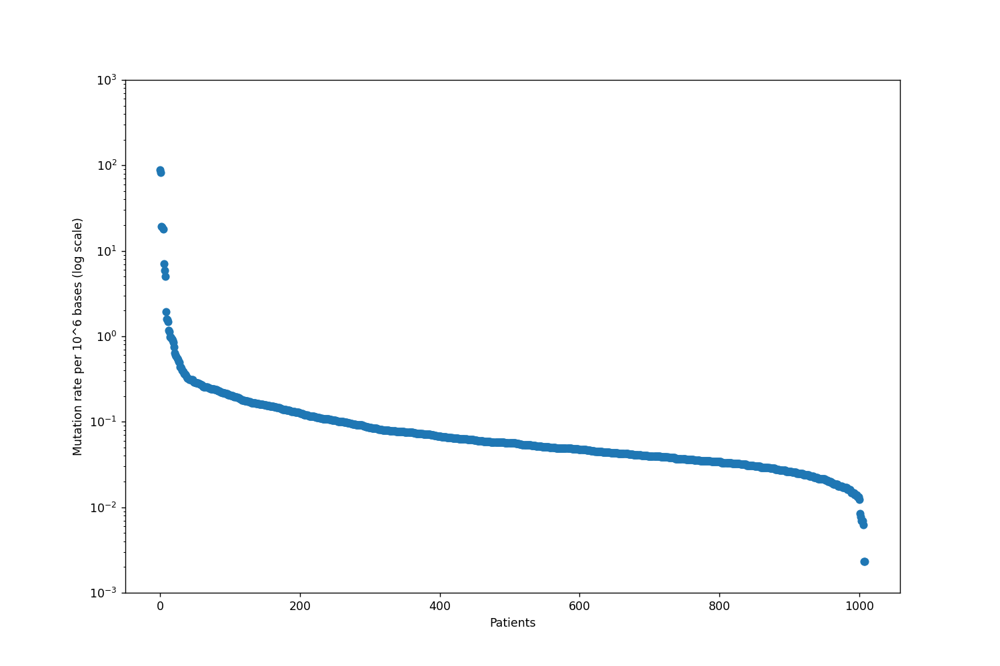

In [94]:
%matplotlib notebook
plt.rcParams['figure.figsize'] = (12, 8)
plt.yscale("log") 
#set axes limit
plt.ylim(0.001, 1000)
plt.scatter(patients, mutation_rate)
plt.xlabel("Patients")
plt.ylabel("Mutation rate per 10^6 bases (log scale)")
plt.show()

In [95]:
genes_patients=data_mutation_FINAL[['PATIENT_ID', 'Hugo_Symbol']]

In [96]:
n_of_pts_per_gene = genes_patients.groupby(['Hugo_Symbol'])['PATIENT_ID'].count().reset_index()
n_of_pts_per_gene.rename(columns = {'PATIENT_ID':'Num_pts_per_gene'}, inplace = True)

In [97]:
# the total number of patients is 1009
tot_pts = 1009

In [98]:
# add a column to the n_of_pts_per_gene dataframe representing the mutation frequency for each gene
n_of_pts_per_gene["Mutation_frequency (%)"] = (n_of_pts_per_gene["Num_pts_per_gene"]*100)/tot_pts

In [99]:
# the numbers of patients per gene are sorted in descending order
n_of_pts_per_gene = n_of_pts_per_gene.sort_values(by="Num_pts_per_gene", ascending=False)

In [100]:
gene_mutation_frequency = n_of_pts_per_gene[['Hugo_Symbol', 'Mutation_frequency (%)']]

In [101]:
# select the first 50 genes
highest_mutated_genes=gene_mutation_frequency.head(50)

In [102]:
mutated_gene_names=highest_mutated_genes['Hugo_Symbol'].tolist()

<IPython.core.display.Javascript object>


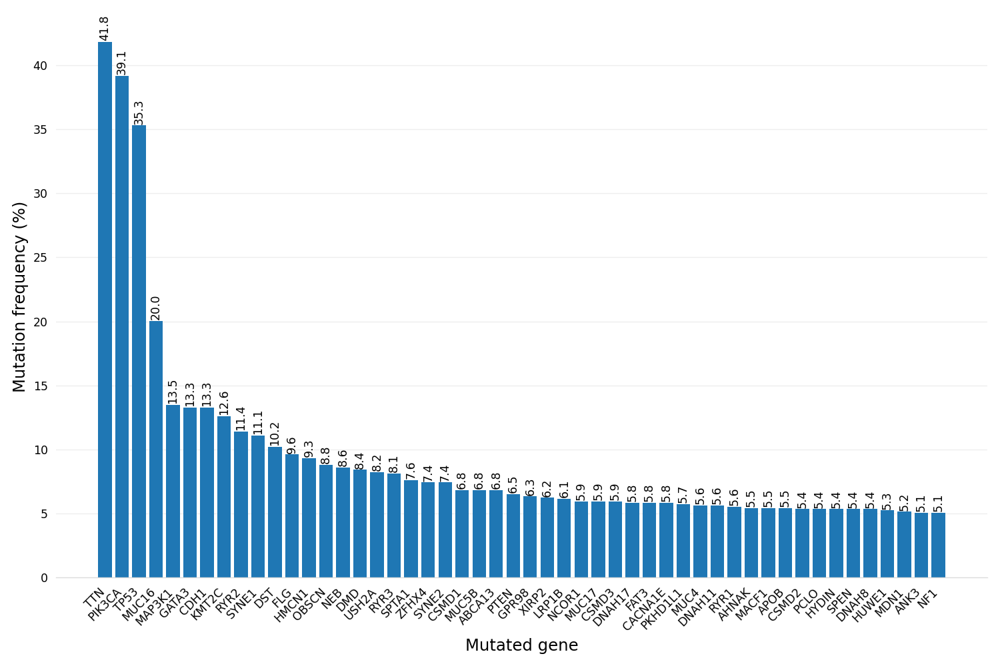

In [103]:
# increase the quality and resolution of the chart
from IPython.display import set_matplotlib_formats
import matplotlib_inline.backend_inline

matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
# set default figure size.
plt.rcParams['figure.figsize'] = (12, 8)
fig, ax = plt.subplots()
h=ax.bar(highest_mutated_genes['Hugo_Symbol'], highest_mutated_genes['Mutation_frequency (%)'], label=mutated_gene_names)
xticks_pos = [0.65*patch.get_width() + patch.get_xy()[0] for patch in h]

_ = plt.xticks(xticks_pos, mutated_gene_names,  ha='right', rotation=45)
#plt.title('Highest mutated genes', fontsize=14)
plt.xlabel('Mutated gene', fontsize=14)
plt.ylabel('Mutation frequency (%)', fontsize=14)


# First, let's remove the top, right and left spines (figure borders)
# which really aren't necessary for a bar chart.
# Also, make the bottom spine gray instead of black.
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')

# Second, remove the ticks as well.
ax.tick_params(bottom=False, left=False)

# Third, add a horizontal grid (but keep the vertical grid hidden).
# Color the lines a light gray as well.
ax.set_axisbelow(True)
ax.yaxis.grid(True, color='#EEEEEE')
ax.xaxis.grid(False)

# Add text annotations to the top of the bars.
# Note, you'll have to adjust this slightly (the 0.3)
# with different data.
for bar in h:
  ax.text(
      bar.get_x() + bar.get_width() / 2,
      bar.get_height() + 0.3,
      round(bar.get_height(), 1),
      rotation='vertical',
      horizontalalignment='center'
  )


fig.tight_layout()

### Normalized Mutation Frequency analysis

In [104]:
# adding the gene length to the gene_mutation_frequency dataset 
gene_mutation_frequency_gene_length = gene_mutation_frequency.join(mutation_TCGA_et_al_group_by_gene.set_index('Hugo_Symbol'), on='Hugo_Symbol')

In [105]:
# add a column to the gene_mutation_frequency_gene_length dataframe representing the mutation frequency for each gene, that is normalized based on the gene length
gene_mutation_frequency_gene_length["Normalized mutation frequency per 10^6"] = (gene_mutation_frequency_gene_length["Mutation_frequency (%)"]/gene_mutation_frequency_gene_length["Gene_length"])*10000

In [106]:
gene_normalized_mutation_frequency = gene_mutation_frequency_gene_length[['Hugo_Symbol', 'Normalized mutation frequency per 10^6']]

In [107]:
# the Normalized mutation frequency per gene is sorted in descending order
gene_normalized_mutation_frequency = gene_normalized_mutation_frequency.sort_values(by="Normalized mutation frequency per 10^6", ascending=False)

In [108]:
# select the first 50 genes
highest_mutated_genes_normalized_frequency=gene_normalized_mutation_frequency.head(50)

In [109]:
mutated_gene_names=highest_mutated_genes_normalized_frequency['Hugo_Symbol'].tolist()

<IPython.core.display.Javascript object>


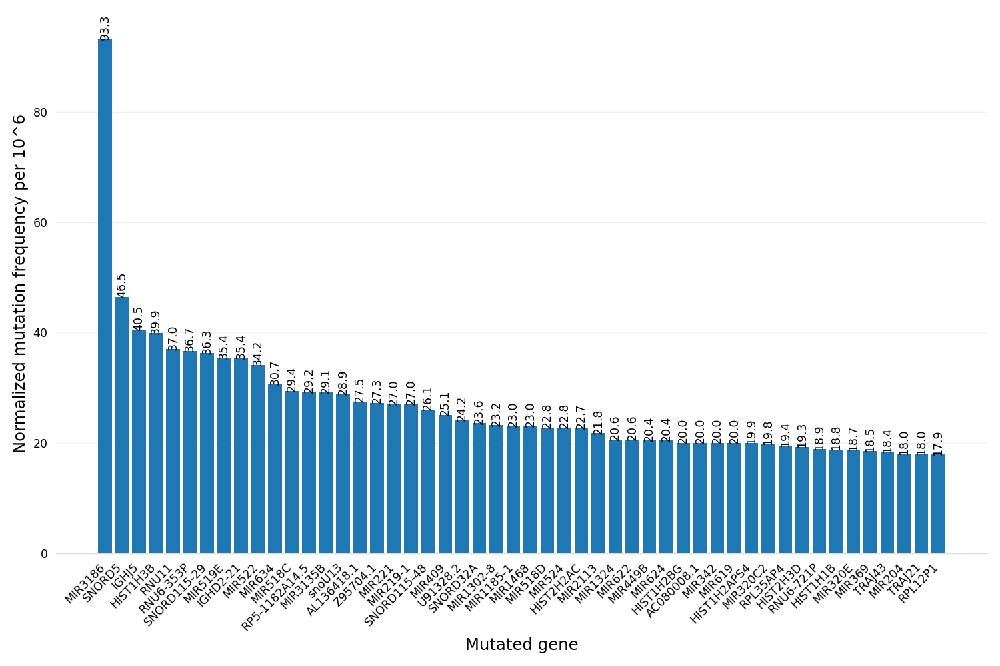

In [110]:
# increase the quality and resolution of the chart
from IPython.display import set_matplotlib_formats
import matplotlib_inline.backend_inline

matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
# set default figure size.
plt.rcParams['figure.figsize'] = (12, 8)
fig, ax = plt.subplots()
h=ax.bar(highest_mutated_genes_normalized_frequency['Hugo_Symbol'], highest_mutated_genes_normalized_frequency['Normalized mutation frequency per 10^6'], label=mutated_gene_names)
xticks_pos = [0.65*patch.get_width() + patch.get_xy()[0] for patch in h]

_ = plt.xticks(xticks_pos, mutated_gene_names,  ha='right', rotation=45)
#plt.title('Highest mutated genes', fontsize=14)
plt.xlabel('Mutated gene', fontsize=14)
plt.ylabel('Normalized mutation frequency per 10^6', fontsize=14)


# First, let's remove the top, right and left spines (figure borders)
# which really aren't necessary for a bar chart.
# Also, make the bottom spine gray instead of black.
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')

# Second, remove the ticks as well.
ax.tick_params(bottom=False, left=False)

# Third, add a horizontal grid (but keep the vertical grid hidden).
# Color the lines a light gray as well.
ax.set_axisbelow(True)
ax.yaxis.grid(True, color='#EEEEEE')
ax.xaxis.grid(False)

# Add text annotations to the top of the bars.
# Note, you'll have to adjust this slightly (the 0.3)
# with different data.
for bar in h:
  ax.text(
      bar.get_x() + bar.get_width() / 2,
      bar.get_height() + 0.3,
      round(bar.get_height(), 1),
      rotation='vertical',
      horizontalalignment='center'
  )


fig.tight_layout()